# Grupo - Gustavo Barroso Souza Cruz & Leonardo Sterman Freitas

# Falar sobre a analise exploratoria

In [53]:
import pickle
import pathlib

import numpy as np
import pandas as pd

Um pouco de pre-pro

In [54]:
# Define o diretório base para os dados e o caminho do arquivo processado
DATA_DIR = pathlib.Path.cwd() / 'data'
clean_data_path = DATA_DIR / 'processed' / 'ames_clean.pkl'

# Carrega o dataset processado a partir de um arquivo pickle
# Esse dataset já deve ter sido previamente limpo e preparado
with open(clean_data_path, 'rb') as file:
    data = pickle.load(file)

# Faz uma cópia do dataset carregado para evitar alterações no original
model_data = data.copy()

# Listas para armazenar colunas categóricas nominais e ordinais
categorical_columns = []
ordinal_columns = []

# Identifica as colunas categóricas no dataset
# Divide-as em ordinais (com ordem implícita) e nominais (sem ordem)
for col in model_data.select_dtypes('category').columns:
    if model_data[col].cat.ordered:  # Verifica se a coluna é ordinal
        ordinal_columns.append(col)
    else:  # Caso contrário, considera nominal
        categorical_columns.append(col)

# Codifica as colunas ordinais com valores inteiros preservando a ordem
# Exemplo: ["low", "medium", "high"] → [0, 1, 2]
for col in ordinal_columns:
    codes, _ = pd.factorize(data[col], sort=True)
    model_data[col] = codes

# Aplica One-Hot Encoding nas colunas categóricas nominais
# Cria colunas binárias para cada categoria, exceto a primeira (drop_first=True)
# Isso reduz a multicolinearidade, útil para modelos lineares
model_data = pd.get_dummies(model_data, drop_first=True)

## Separação treino e teste

In [55]:
from sklearn.model_selection import train_test_split

# Separa os dados em features (X) e target (y)
X = model_data.drop(columns=['SalePrice']).copy()
y = model_data['SalePrice'].copy()

# Divide os dados em conjuntos de treino e teste
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2, # 20% dos dados para teste
    random_state=42
)

# Models to be tested:

- Linear Regression (Baseline)
- Ridge Regression (Linear Model)
- Random Forest (Ensemble)
- LightGBM (Gradient Boosting)
- CatBoost (Gradient Boosting - good for categorical features)
- XGBoost (Gradient Boosting - [state of the art for housing price prediction](https://arxiv.org/abs/2402.04082))

In [62]:
from sklearn.metrics import mean_squared_error

def print_errors(y_true, y_pred):
    """Shows RMSE and error percentage for a model's predictions."""
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    error_percent = 100 * (10 ** rmse -1)

    print(f'RMSE: {rmse:.4f}')
    print(f'Average error: {error_percent:.2f}%')

## Linear Regression

- Simple model that could be used as a baseline

In [63]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

model = LinearRegression()

# Training the model
model.fit(X_train, y_train)

# Predicting the target on the training set
y_pred = model.predict(X_test)

print_errors(y_test, y_pred)

RMSE: 0.0583
Average error: 14.37%


## Ridge Regression

- Um modelo linear que usa regularização L2 para evitar overfitting (penaliza os coeficientes muito grandes)

In [64]:
from sklearn.linear_model import RidgeCV

# Ridge regression model with cross-validation to find the best alpha
model = RidgeCV(
    alphas=[0.1, 1.0, 10.0, 100.0],
    store_cv_values=True
)

# Training the model
model.fit(X_train, y_train)

# Predicting the target on the training set
y_pred = model.predict(X_test)


print(f'Best alpha is {model.alpha_}')
print_errors(y_test, y_pred)

Best alpha is 10.0
RMSE: 0.0591
Average error: 14.58%


/Users/gubscruz/Downloads/INSPER/4_PERIODO/machine-learning/ames-aps/ames-machine-learning/env/lib/python3.13/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


## Random Forest

- Ensemble model that uses multiple decision trees to make predictions
- Can handle non-linear relationships and interactions between features
- Can handle missing values and outliers

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
import numpy as np

# Define the RandomForestRegressor model
rf_model = RandomForestRegressor(random_state=42)

# Define the grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],      # Number of trees in the forest
    'max_depth': [10, 20],          # Maximum depth of each tree
    'min_samples_split': [2, 5],      # Minimum number of samples to split an internal node
    'min_samples_leaf': [2, 4],        # Minimum number of samples required to be at a leaf node
    'bootstrap': [True]
}

# Set up the GridSearchCV
grid_search = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    cv=5, # 5-fold cross-validation
    scoring='neg_mean_squared_error',
    n_jobs=-1
)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Get the best model from the grid search
best_rf_model = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_rf_model.predict(X_test)

# Print results
print(f"Best Hyperparameters: {grid_search.best_params_}")
print_errors(y_test, y_pred)

Best Hyperparameters: {'bootstrap': True, 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
RMSE: 0.0566
Average error: 13.92%


#### Most important features for Random Forest

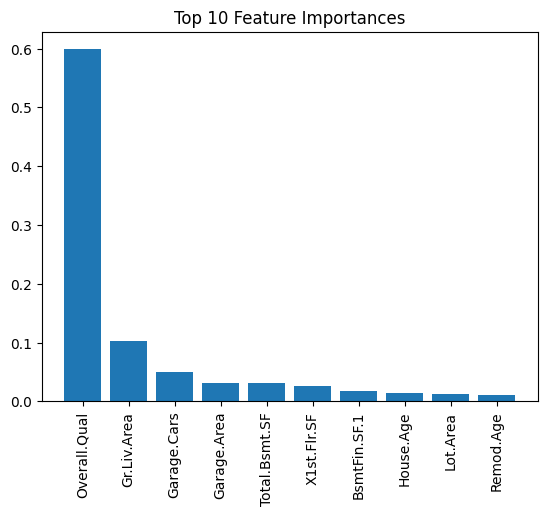

In [ ]:
import matplotlib.pyplot as plt

# Get the feature importances and sort them
feature_importances = best_rf_model.feature_importances_
sorted_indices = np.argsort(feature_importances)[::-1]

top_n = 10
top_indices = sorted_indices[:top_n]

# Plot the top 10 features
plt.bar(range(top_n), feature_importances[top_indices])
plt.xticks(range(top_n), X_train.columns[top_indices], rotation=90)
plt.title("Top 10 Feature Importances")
plt.show()


## LightGBM

- Gradient boosting model that uses decision trees
- Can handle missing values and categorical features
- Fast training speed and high efficiency
- Similar to XGBoost

In [72]:
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV

lgb_model = lgb.LGBMRegressor(random_state=42)

# Hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.7, 0.8]
}

# Set up the GridSearchCV
grid_search = GridSearchCV(
    estimator=lgb_model,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1
)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Get the best model from the grid search
best_model = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_model.predict(X_test)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise

In [73]:
print(f"Best Hyperparameters: {grid_search.best_params_}")
print_errors(y_test, y_pred)

Best Hyperparameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300, 'subsample': 0.8}
RMSE: 0.0490
Average error: 11.95%


## CatBoost

- Very similar to LightGBM but can handle categorical features better

In [ ]:
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
import numpy as np

# Define the CatBoostRegressor model
cat_model = CatBoostRegressor(
    random_state=42,
    silent=True  # Suppresses output for cleaner logs
)

# Define the grid of hyperparameters to search
param_grid = {
    'iterations': [500, 1000],        # Number of boosting iterations
    'depth': [4, 6, 8],              # Depth of the trees
    'learning_rate': [0.05, 0.1, 0.2],  # Learning rate
    'l2_leaf_reg': [1, 3, 5]         # L2 regularization strength
}

# Set up the GridSearchCV
grid_search = GridSearchCV(
    estimator=cat_model,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='neg_mean_squared_error',
    n_jobs=-1
)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Get the best model from the grid search
best_cat_model = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_cat_model.predict(X_test)

print(f"Best Hyperparameters: {grid_search.best_params_}")
print_errors(y_test, y_pred)

In [ ]:
import matplotlib.pyplot as plt

# Plot feature importance
plt.figure(figsize=(10, 8))
cat_model.fit(X_train, y_train)  # Fit the model before plotting
cat.plot_importance(cat_model, importance_type='weight', max_num_features=10)
plt.title('Feature Importance')
plt.show()


## XGBoost

- Very popular gradient boosting model
- Won many Kaggle competitions
- Good for structured/tabular data

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
import numpy as np

# Define the XGBoost model
xgb_model = XGBRegressor(random_state=42)

# Define the grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],    # Number of boosting rounds
    'max_depth': [3, 5, 7],            # Maximum depth of the trees
    'learning_rate': [0.05, 0.1, 0.2], # Step size shrinkage
    'subsample': [0.8, 1.0],           # Fraction of samples used for training each tree
    'colsample_bytree': [0.8, 1.0]     # Fraction of features used for training each tree
}

# Set up the GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='neg_mean_squared_error',
    verbose=2,
    n_jobs=-1
)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Get the best model from the grid search
best_xgb_model = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_xgb_model.predict(X_test)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# Optionally calculate error percentage if target is in a log-transformed scale
error_percent = 100 * (10**rmse - 1)

# Print results
print(f"Best Hyperparameters: {grid_search.best_params_}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Average Error Percentage: {error_percent:.2f}%")


In [ ]:
import matplotlib.pyplot as plt

# Plot feature importance
plt.figure(figsize=(10, 8))
xgb_model.fit(X_train, y_train)  # Fit the model before plotting
xgb.plot_importance(xgb_model, importance_type='weight', max_num_features=10)
plt.title('Feature Importance')
plt.show()


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise